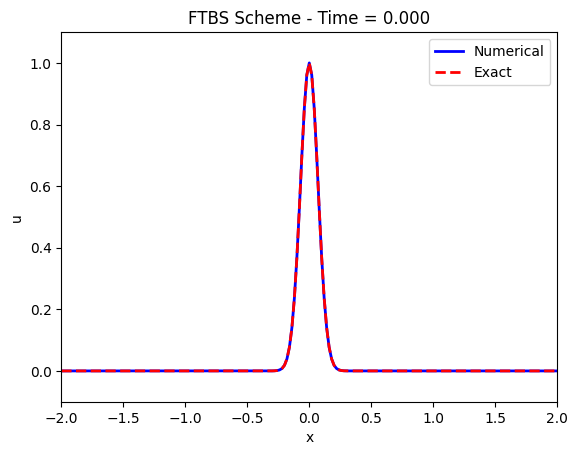

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- Parameters ---
c = 1.0                  # Convection speed
L = 2.0                  # Domain half-length [-L, L]
nx = 201                 # Number of spatial points
x = np.linspace(-L, L, nx)
dx = x[1] - x[0]

CFL = 0.5               # CFL number
dt = CFL * dx / c        # Time step from CFL condition
t_final = 1.0            # Total simulation time
nt = int(t_final / dt)   # Number of time steps
al=100
# --- Initial Condition ---
def initial_condition(x):
    return np.exp(-al * x**2)

# --- Periodic Boundary Condition ---
def apply_periodic(u):
    u[0] = u[-2]
    u[-1] = u[1]
    return u

# --- Numerical Schemes ---
def ftbs(u, c, dt, dx):
    un = u.copy()
    u[1:-1] = un[1:-1] - c * dt / dx * (un[1:-1] - un[0:-2])
    return apply_periodic(u)

def ftfs(u, c, dt, dx):
    un = u.copy()
    u[1:-1] = un[1:-1] - c * dt / dx * (un[2:] - un[1:-1])
    return apply_periodic(u)

def ftcs(u, c, dt, dx):
    un = u.copy()
    u[1:-1] = un[1:-1] - 0.5 * c * dt / dx * (un[2:] - un[0:-2])
    return apply_periodic(u)

# --- Exact Solution ---
def exact_solution(x, t, c):
    return np.exp(-al * (x - c * t)**2)

# --- Simulation Function ---
def simulate(scheme):
    u = initial_condition(x)
    u = np.concatenate(([u[-2]], u, [u[1]]))  # Add ghost cells for periodic BC
    us = [u.copy()]
    ts = [0.0]
    for i in range(nt):
        u = scheme(u, c, dt, dx)
        us.append(u.copy())
        ts.append((i+1)*dt)
    return x, us, ts

# --- Choose scheme here: ftbs, ftfs, ftcs ---
scheme = ftbs  # You can change to ftfs or ftcs

# --- Run simulation ---
x, us, ts = simulate(scheme)

# --- Create Animation ---
fig, ax = plt.subplots()
line_num, = ax.plot(x, us[0][1:-1], 'b-', lw=2, label='Numerical')
line_exact, = ax.plot(x, exact_solution(x, 0, c), 'r--', lw=2, label='Exact')
ax.set_xlim(-L, L)
ax.set_ylim(-0.1, 1.1)
ax.set_title(f"{scheme.__name__.upper()} Scheme")
ax.set_xlabel("x")
ax.set_ylabel("u")
ax.legend()

def animate(i):
    line_num.set_ydata(us[i][1:-1])
    line_exact.set_ydata(exact_solution(x, ts[i], c))
    ax.set_title(f"{scheme.__name__.upper()} Scheme - Time = {ts[i]:.3f}")
    return line_num, line_exact

ani = FuncAnimation(fig, animate, frames=len(us), interval=30)

# --- Display animation inline in Jupyter ---
HTML(ani.to_jshtml())
# Save the animation as MP4
# ani.save("linear_convection_FTBS.mp4", writer='ffmpeg', fps=30)



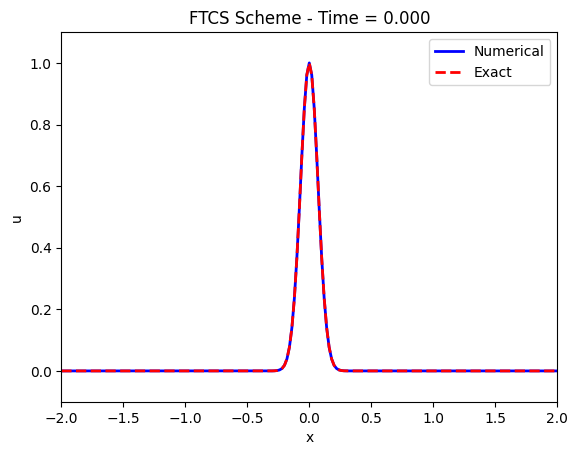

In [14]:
scheme = ftcs  # You can change to ftfs or ftcs

# --- Run simulation ---
x, us, ts = simulate(scheme)

# --- Create Animation ---
fig, ax = plt.subplots()
line_num, = ax.plot(x, us[0][1:-1], 'b-', lw=2, label='Numerical')
line_exact, = ax.plot(x, exact_solution(x, 0, c), 'r--', lw=2, label='Exact')
ax.set_xlim(-L, L)
ax.set_ylim(-0.1, 1.1)
ax.set_title(f"{scheme.__name__.upper()} Scheme")
ax.set_xlabel("x")
ax.set_ylabel("u")
ax.legend()

def animate(i):
    line_num.set_ydata(us[i][1:-1])
    line_exact.set_ydata(exact_solution(x, ts[i], c))
    ax.set_title(f"{scheme.__name__.upper()} Scheme - Time = {ts[i]:.3f}")
    return line_num, line_exact

ani = FuncAnimation(fig, animate, frames=len(us), interval=30)

# --- Display animation inline in Jupyter ---
HTML(ani.to_jshtml())
# ani.save("linear_convection_FTCS.mp4", writer='ffmpeg', fps=30)

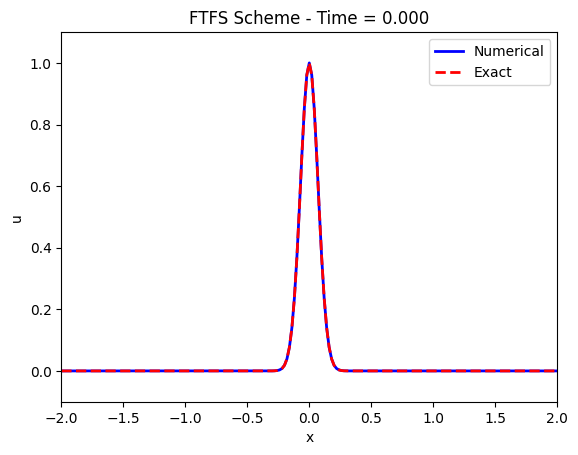

In [15]:
scheme = ftfs  # You can change to ftfs or ftcs

# --- Run simulation ---
x, us, ts = simulate(scheme)

# --- Create Animation ---
fig, ax = plt.subplots()
line_num, = ax.plot(x, us[0][1:-1], 'b-', lw=2, label='Numerical')
line_exact, = ax.plot(x, exact_solution(x, 0, c), 'r--', lw=2, label='Exact')
ax.set_xlim(-L, L)
ax.set_ylim(-0.1, 1.1)
ax.set_title(f"{scheme.__name__.upper()} Scheme")
ax.set_xlabel("x")
ax.set_ylabel("u")
ax.legend()

def animate(i):
    line_num.set_ydata(us[i][1:-1])
    line_exact.set_ydata(exact_solution(x, ts[i], c))
    ax.set_title(f"{scheme.__name__.upper()} Scheme - Time = {ts[i]:.3f}")
    return line_num, line_exact

ani = FuncAnimation(fig, animate, frames=len(us), interval=30)

# --- Display animation inline in Jupyter ---
HTML(ani.to_jshtml())
# ani.save("linear_convection_FTFS.mp4", writer='ffmpeg', fps=30)